In [2]:
pip install imblearn

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install ydata-profiling

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import warnings
warnings.filterwarnings('ignore')
from category_encoders import MEstimateEncoder
from imblearn.over_sampling import SMOTE
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [4]:
df = pd.read_csv("application_record.csv")

In [5]:
df2 = pd.read_csv("credit_record.csv")

In [5]:
df.describe(include='all')

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
count,4.385570e+05,438557,438557,438557,438557.000000,4.385570e+05,438557,438557,438557,438557,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,304354,438557.000000
unique,NaN,2,2,2,NaN,NaN,5,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN
freq,NaN,294440,275459,304074,NaN,NaN,226104,301821,299828,393831,NaN,NaN,NaN,NaN,NaN,NaN,78240,NaN
mean,6.022176e+06,NaN,NaN,NaN,0.427390,1.875243e+05,NaN,NaN,NaN,NaN,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,NaN,2.194465
std,5.716370e+05,NaN,NaN,NaN,0.724882,1.100869e+05,NaN,NaN,NaN,NaN,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,NaN,0.897207
min,5.008804e+06,NaN,NaN,NaN,0.000000,2.610000e+04,NaN,NaN,NaN,NaN,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,NaN,1.000000
25%,5.609375e+06,NaN,NaN,NaN,0.000000,1.215000e+05,NaN,NaN,NaN,NaN,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
50%,6.047745e+06,NaN,NaN,NaN,0.000000,1.607805e+05,NaN,NaN,NaN,NaN,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
75%,6.456971e+06,NaN,NaN,NaN,1.000000,2.250000e+05,NaN,NaN,NaN,NaN,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,NaN,3.000000


In [6]:
df.shape

(438557, 18)

In [7]:
df2.describe(include='all')

,ID,MONTHS_BALANCE,STATUS
count,1.048575e+06,1.048575e+06,1048575
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,442031
mean,5.068286e+06,-1.913700e+01,NaN
std,4.615058e+04,1.402350e+01,NaN
min,5.001711e+06,-6.000000e+01,NaN
25%,5.023644e+06,-2.900000e+01,NaN
50%,5.062104e+06,-1.700000e+01,NaN
75%,5.113856e+06,-7.000000e+00,NaN


In [8]:
df2.shape

(1048575, 3)

In [8]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile = ProfileReport(df2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#each customer transaction history
grouped=df2.groupby('ID')['STATUS'].value_counts()
grouped

ID       STATUS
5001711  0          3
         X          1
5001712  0         10
         C          9
5001713  X         22
                   ..
5150483  X         18
5150484  0         12
         C          1
5150485  0          2
5150487  C         30
Name: STATUS, Length: 94143, dtype: int64

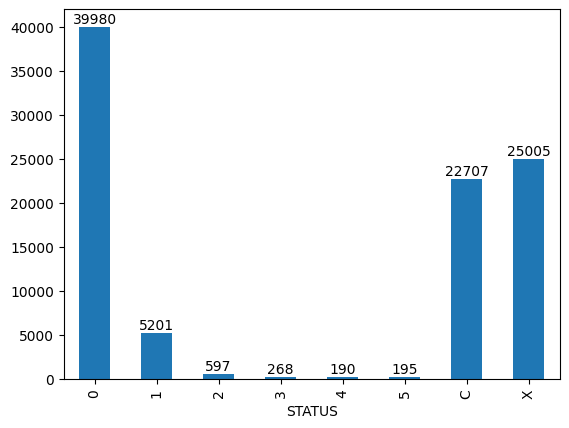

In [22]:
%matplotlib inline
z=grouped.groupby('STATUS').count()
fig, ax = plt.subplots()
z.plot(kind='bar', ax=ax)

# add labels to each bar
for i, v in enumerate(z.values):
    ax.text(i, v + 400, str(v), ha='center')

plt.show()

#most customer had past due record of 1-29 days (0)
#second high is customer without a balance - did not use the card (X)
#third high is customer paid off the balance that month (C)
#low presentage on delinquent (1-5) 

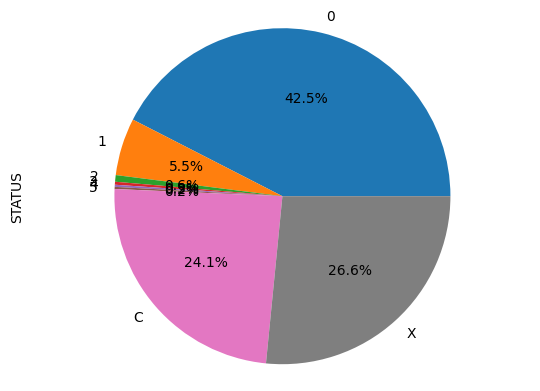

In [23]:
z.plot(kind='pie', autopct='%1.1f%%')

plt.axis('equal')
plt.show()

In [24]:
history=pd.get_dummies(data=df2,columns=['STATUS'],
                              prefix='',prefix_sep='').groupby('ID')[sorted(df2['STATUS'].unique().tolist())].sum()
history=history.rename(columns=
                      {'0':'pastdue',
                       '1':'30+',
                       '2':'60+',
                       '3':'90+',
                       '4':'120+',
                       '5':'150+',
                       'C':'paid_off',
                       'X':'no_usage',
                      })

overall_pastdue=['30+',	'60+',	'90+'	,'120+',	'150+']
history['number_of_months']=df2.groupby('ID')['MONTHS_BALANCE'].count()
history['over_90']=history[['90+','120+','150+']].sum(axis=1)
history['less_90']=history[['pastdue','30+','60+']].sum(axis=1)
history['overall_pastdue']=history[overall_pastdue].sum(axis=1)
history['pastdue_ratio']=round(history['pastdue']/ history['number_of_months'], 2)
history['overdue_ratio']=round(history['overall_pastdue']/ history['number_of_months'], 2)
history.head()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.0
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.0
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.0
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.0
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.0


In [25]:
history.sum()

pastdue              383120.00
30+                   11090.00
60+                     868.00
90+                     320.00
120+                    223.00
150+                   1693.00
paid_off             442031.00
no_usage             209230.00
number_of_months    1048575.00
over_90                2236.00
less_90              395078.00
overall_pastdue       14194.00
pastdue_ratio         21215.32
overdue_ratio           667.91
dtype: float64

show the number of customers who have overdue payments (pastdue), those who have paid off their credit card balance (paid_off), also who have no usage of their credit card (no_usage)

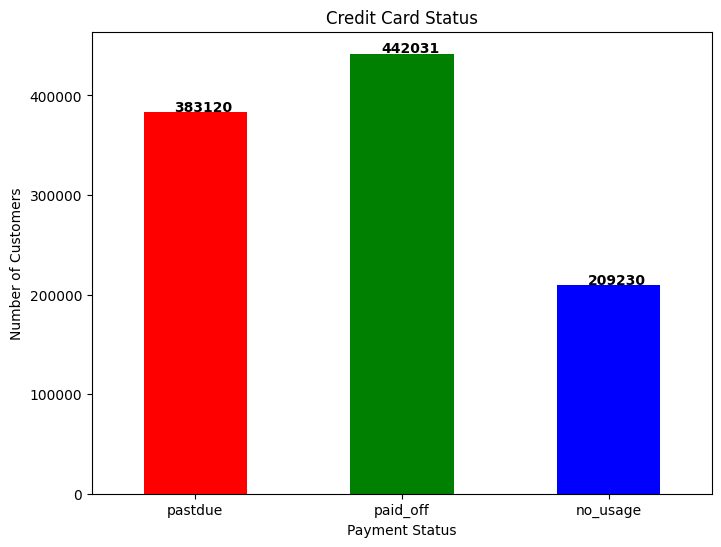

In [31]:
fig, ax = plt.subplots(figsize=(8,6))

# Plot bar chart
history[['pastdue', 'paid_off','no_usage']].sum().plot(kind='bar', ax=ax, color=['r', 'g','b'])

# Add title and labels
ax.set_title('Credit Card Status')
ax.set_xlabel('Payment Status')
ax.set_ylabel('Number of Customers')
plt.xticks(rotation=0)

# Add annotations
for i, v in enumerate(history[['pastdue', 'paid_off','no_usage']].sum().values):
    ax.text(i-0.1, v+1000, str(v), color='black', fontweight='bold')

plt.show()

the relationship between the number of months with overdue payments and the number of months with no overdue payments

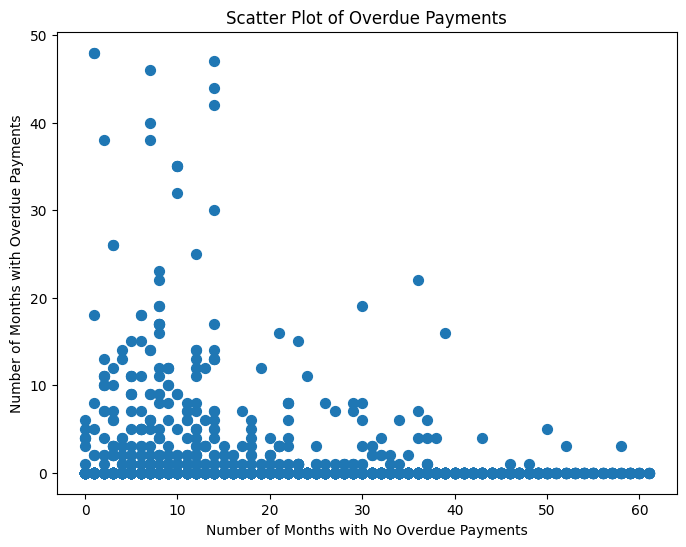

In [32]:
fig, ax = plt.subplots(figsize=(8,6))

# Plot scatter plot
ax.scatter(history['less_90'], history['over_90'], s=50)

# Add title and labels
ax.set_title('Scatter Plot of Overdue Payments')
ax.set_xlabel('Number of Months with No Overdue Payments')
ax.set_ylabel('Number of Months with Overdue Payments')

plt.show()

Number of months vs. overall pastdue

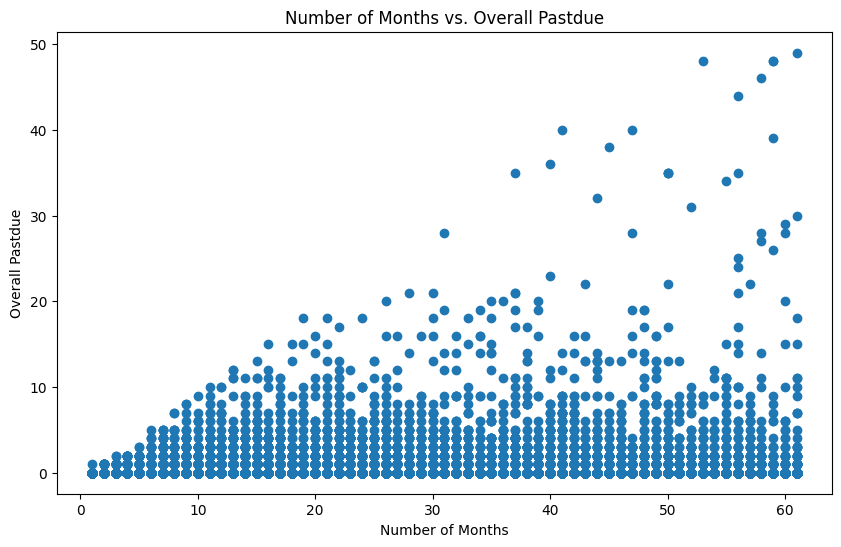

In [38]:
fig, ax = plt.subplots(figsize=(10,6))
plt.scatter(history['number_of_months'], history['overall_pastdue'])
plt.xlabel('Number of Months')
plt.ylabel('Overall Pastdue')
plt.title('Number of Months vs. Overall Pastdue')
plt.show()

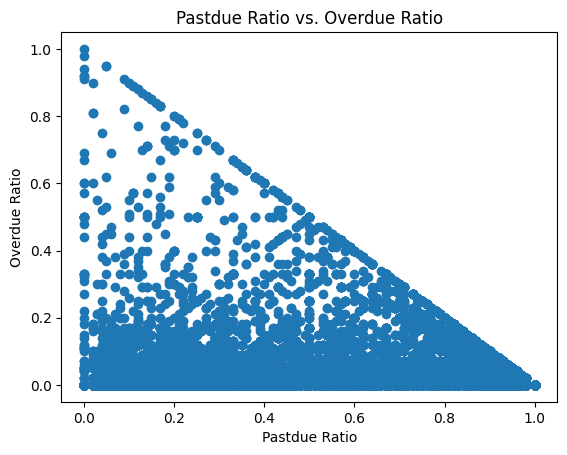

In [35]:
plt.scatter(history['pastdue_ratio'], history['overdue_ratio'])
plt.xlabel('Pastdue Ratio')
plt.ylabel('Overdue Ratio')
plt.title('Pastdue Ratio vs. Overdue Ratio')
plt.show()

the distribution of borrowers in terms of their past due and overall overdue ratios

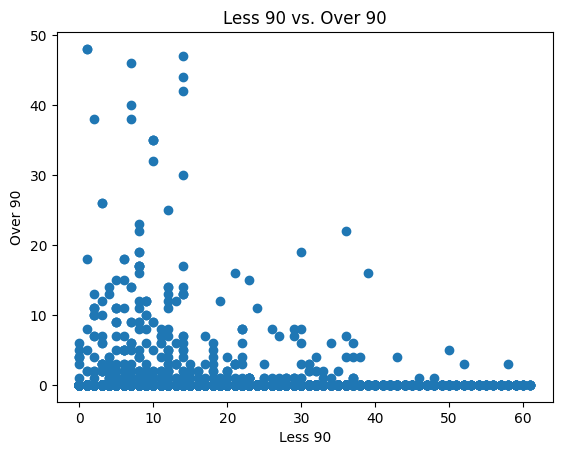

In [39]:
plt.scatter(history['less_90'], history['over_90'])
plt.xlabel('Less 90')
plt.ylabel('Over 90')
plt.title('Less 90 vs. Over 90')
plt.show()

the number of months a borrower has been less than 90 days past due relates to the number of months they have been more than 90 days past due. It shows you the distribution of borrowers in terms of their less than 90 days past due and more than 90 days past due periods

the overall distribution of customer's credit card status

In [8]:
history.head(20)

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.00
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.00
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.00
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.00
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.00
5001717,17,0,0,0,0,0,5,0,22,0,17,0,0.77,0.00
5001718,24,2,0,0,0,0,3,10,39,0,26,2,0.62,0.05
5001719,2,0,0,0,0,0,41,0,43,0,2,0,0.05,0.00
5001720,29,7,0,0,0,0,0,0,36,0,36,7,0.81,0.19


In [44]:
#specify dependent variable 
target=[]
for index,row in history.iterrows() :
  if row['number_of_months'] < 6 :
    target.append(1)
  elif row['150+'] > 0 or (row['no_usage'] == row['number_of_months']) or (row['over_90'] > row['less_90']):
    target.append(0)
  elif row['pastdue_ratio'] > 0.70 and row['overall_pastdue'] >= 1 :
    target.append(0) 
  elif row['overdue_ratio'] > 0.10 and row['over_90'] >= 1 :
    target.append(0)
  else:
    target.append(1)

history['class']=target
history['class'].value_counts()

1    40200
0     5785
Name: class, dtype: int64

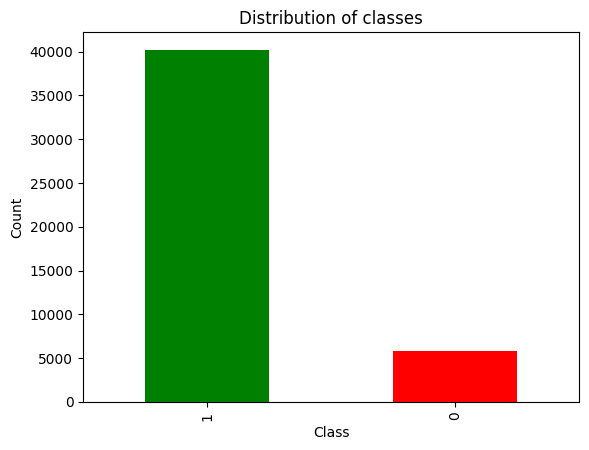

In [49]:
history['class'].value_counts().plot(kind='bar', color=['g','r'])
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribution of classes')
plt.show()

In [10]:
#unbalance set
history.describe()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000
mean,8.331412,0.241166,0.018876,0.006959,0.004849,0.036816,9.612504,4.549962,22.802544,0.048625,8.591454,0.308666,0.461353,0.014525,0.874198
std,8.234128,0.990994,0.197607,0.101931,0.084188,0.855981,13.625156,9.622719,15.492771,0.935266,8.442478,1.512753,0.348173,0.061086,0.331630
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,3.000000,34.000000,0.000000,12.000000,0.000000,0.800000,0.000000,1.000000
max,61.000000,38.000000,8.000000,8.000000,7.000000,48.000000,60.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [11]:
df.duplicated().sum()

0

<AxesSubplot: >

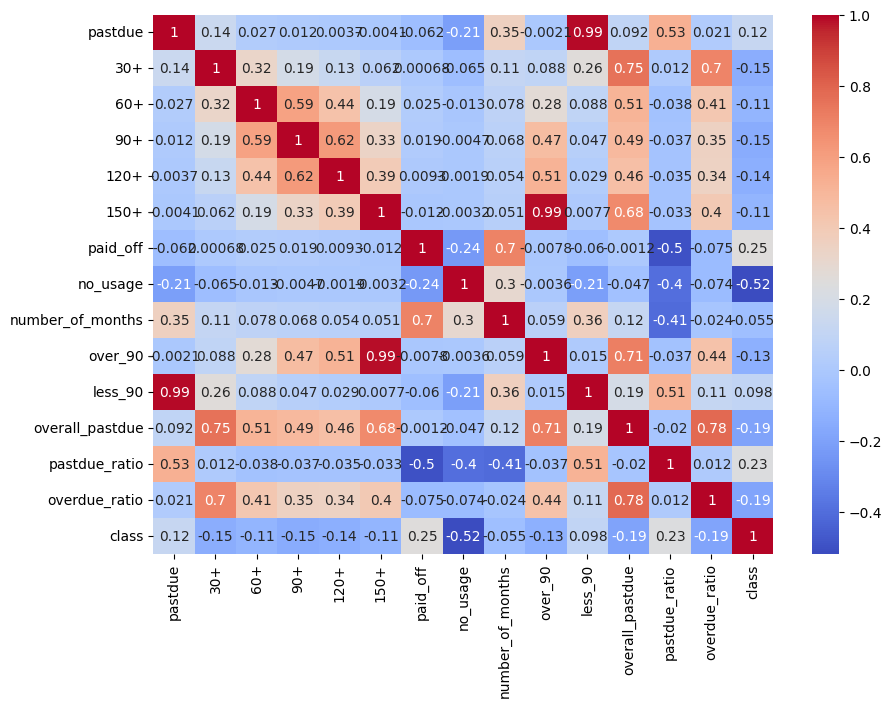

In [53]:
fig, ax = plt.subplots(figsize=(10,7))
corr_matrix = history.corr()
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

This could give me an idea of which features are most strongly correlated with each other, and which ones might be good predictors for classifier. This heatmap with the correlation coefficients between each pair of features from the 'history' dataframe, where warmer colors indicate stronger positive correlation and cooler colors indicate stronger negative correlation. The 'annot=True' argument will also display the actual correlation coefficients on the heatmap.

In [55]:
#merging 2 sets
#leave the ones constructed the class label out
features=['number_of_months','class']
new_features=history.loc[:,features]
mdf=pd.merge(df,new_features,on='ID')
mdf.index=mdf['ID']
mdf.drop('ID',axis=1, inplace=True)
mdf.drop_duplicates(inplace=True)
mdf.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,class
ID,,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,16,1
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15,1
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,30,1
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,5,1
5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,27,1


In [13]:
mdf.duplicated().sum()

0

In [14]:
mdf.describe()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,number_of_months,class
count,28083.000000,2.808300e+04,28083.000000,28083.000000,28083.0,28083.000000,28083.000000,28083.000000,28083.000000,28083.000000,28083.000000
mean,0.428088,1.865543e+05,-15978.420325,59187.125450,1.0,0.226543,0.294199,0.091692,2.198269,22.603746,0.873803
std,0.748417,1.011737e+05,4202.054256,137584.177672,0.0,0.418602,0.455690,0.288596,0.915138,15.199870,0.332078
min,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,0.000000,1.215000e+05,-19441.000000,-3153.000000,1.0,0.000000,0.000000,0.000000,2.000000,10.000000,1.000000
50%,0.000000,1.575000e+05,-15569.000000,-1539.000000,1.0,0.000000,0.000000,0.000000,2.000000,19.000000,1.000000
75%,1.000000,2.250000e+05,-12461.000000,-405.000000,1.0,0.000000,1.000000,0.000000,3.000000,33.000000,1.000000
max,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,61.000000,1.000000


In [15]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28083 entries, 5008804 to 5150337
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          28083 non-null  object 
 1   FLAG_OWN_CAR         28083 non-null  object 
 2   FLAG_OWN_REALTY      28083 non-null  object 
 3   CNT_CHILDREN         28083 non-null  int64  
 4   AMT_INCOME_TOTAL     28083 non-null  float64
 5   NAME_INCOME_TYPE     28083 non-null  object 
 6   NAME_EDUCATION_TYPE  28083 non-null  object 
 7   NAME_FAMILY_STATUS   28083 non-null  object 
 8   NAME_HOUSING_TYPE    28083 non-null  object 
 9   DAYS_BIRTH           28083 non-null  int64  
 10  DAYS_EMPLOYED        28083 non-null  int64  
 11  FLAG_MOBIL           28083 non-null  int64  
 12  FLAG_WORK_PHONE      28083 non-null  int64  
 13  FLAG_PHONE           28083 non-null  int64  
 14  FLAG_EMAIL           28083 non-null  int64  
 15  OCCUPATION_TYPE      19475 n

In [16]:
mdf.corr()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,number_of_months,class
CNT_CHILDREN,1.000000,0.029119,0.334121,-0.227424,NaN,0.042909,-0.022226,0.011322,0.890447,-0.007517,-0.009293
AMT_INCOME_TOTAL,0.029119,1.000000,0.065492,-0.168659,NaN,-0.032765,0.020283,0.090552,0.020743,0.022562,-0.038029
DAYS_BIRTH,0.334121,0.065492,1.000000,-0.614483,NaN,0.182343,-0.029467,0.104355,0.297257,-0.061375,-0.011624
DAYS_EMPLOYED,-0.227424,-0.168659,-0.614483,1.000000,NaN,-0.243377,-0.006729,-0.084019,-0.219954,-0.005415,0.013575
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.042909,-0.032765,0.182343,-0.243377,NaN,1.000000,0.304161,-0.034001,0.058527,0.016443,-0.002852
FLAG_PHONE,-0.022226,0.020283,-0.029467,-0.006729,NaN,0.304161,1.000000,0.012574,-0.012817,0.016055,-0.013262
FLAG_EMAIL,0.011322,0.090552,0.104355,-0.084019,NaN,-0.034001,0.012574,1.000000,0.008017,0.005166,-0.004846
CNT_FAM_MEMBERS,0.890447,0.020743,0.297257,-0.219954,NaN,0.058527,-0.012817,0.008017,1.000000,0.010635,-0.008476
number_of_months,-0.007517,0.022562,-0.061375,-0.005415,NaN,0.016443,0.016055,0.005166,0.010635,1.000000,-0.029266


In [12]:
profile = ProfileReport(mdf)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
mdf.corrwith(mdf['class'])*100

CNT_CHILDREN         -0.929257
AMT_INCOME_TOTAL     -3.802944
DAYS_BIRTH           -1.162360
DAYS_EMPLOYED         1.357487
FLAG_MOBIL                 NaN
FLAG_WORK_PHONE      -0.285183
FLAG_PHONE           -1.326218
FLAG_EMAIL           -0.484596
CNT_FAM_MEMBERS      -0.847586
number_of_months     -2.926613
class               100.000000
dtype: float64

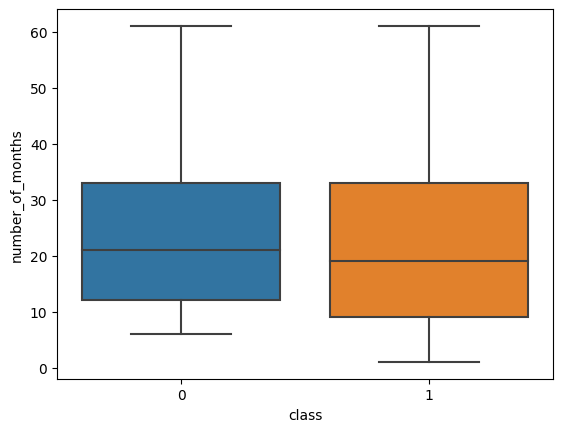

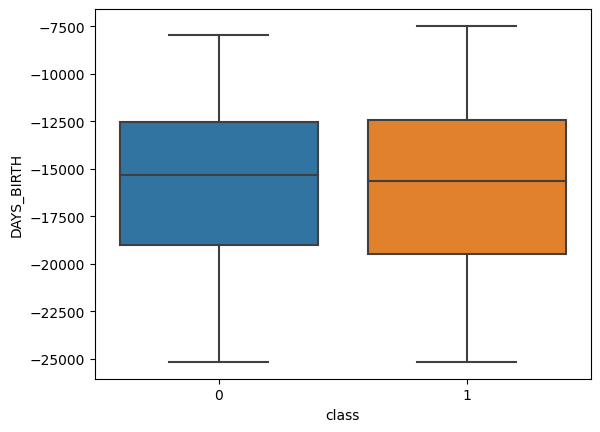

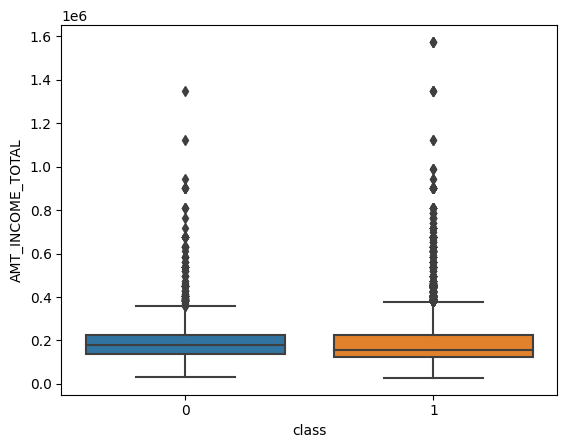

In [63]:
sns.boxplot(x='class', y='number_of_months', data=mdf)
plt.show()

sns.boxplot(x='class', y='DAYS_BIRTH', data=mdf)
plt.show()

sns.boxplot(x='class', y='AMT_INCOME_TOTAL', data=mdf)
plt.show()

Box plot of features by class: You can create a box plot to see how the different features are distributed by class. This will help you identify any patterns or differences in the distribution of features between the two classes.

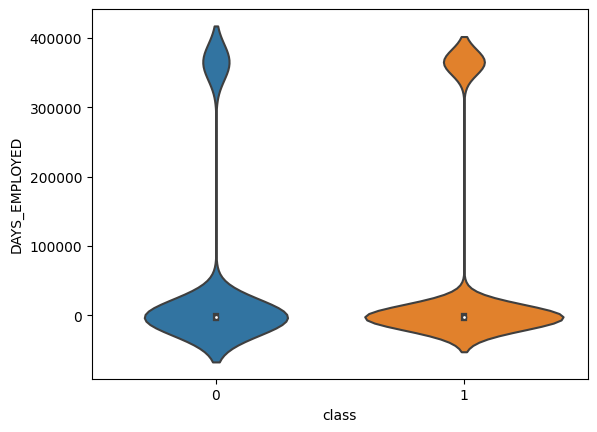

In [66]:
sns.violinplot(x='class', y='DAYS_EMPLOYED', data=mdf)
plt.show()

Violin plot of features by class: You can create a violin plot to see how the different features are distributed by class. This will help you identify any patterns or differences in the distribution of features between the two classes.

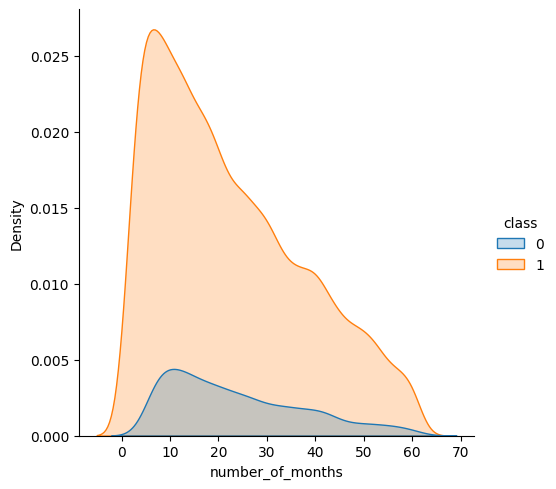

In [68]:
sns.displot(data=mdf, x='number_of_months', hue='class', kind='kde', fill=True)
plt.show()

In [17]:
mdf['OCCUPATION_TYPE'].unique()

array([nan, 'Security staff', 'Sales staff', 'Accountants', 'Laborers',
       'Managers', 'Drivers', 'Core staff', 'High skill tech staff',
       'Cleaning staff', 'Private service staff', 'Cooking staff',
       'Low-skill Laborers', 'Medicine staff', 'Secretaries',
       'Waiters/barmen staff', 'HR staff', 'Realty agents', 'IT staff'],
      dtype=object)

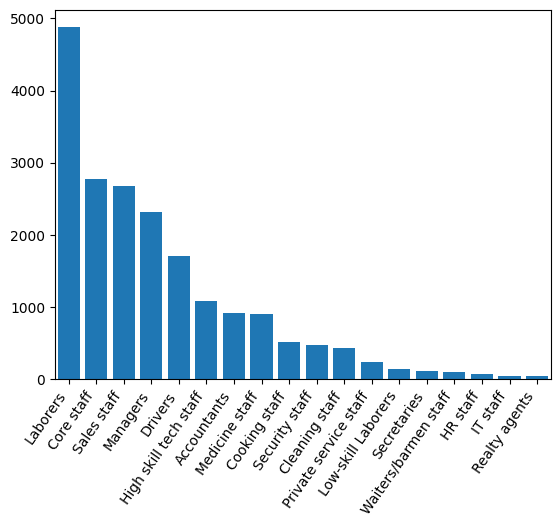

In [79]:
value_counts = mdf['OCCUPATION_TYPE'].value_counts()
fig, ax = plt.subplots()
ax.bar(value_counts.index, value_counts.values)
ax.set_xticklabels(value_counts.index, rotation=55, ha='right')
ax.set_xlim(-0.5, len(value_counts.index) - 0.5)
plt.show()

<AxesSubplot: xlabel='count', ylabel='OCCUPATION_TYPE'>

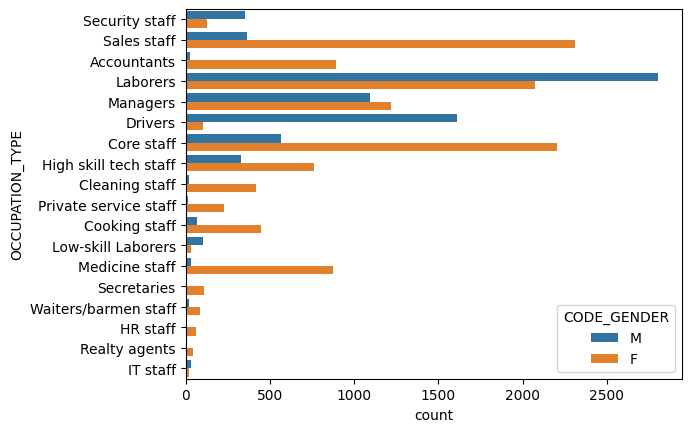

In [41]:
sns.countplot(y='OCCUPATION_TYPE',hue='CODE_GENDER',data=mdf)

In [85]:
#split the merged set into features and label
y = mdf['class']
x = mdf.drop(columns=['class'],axis=1)
x

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,16
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,30
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,5
5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5149828,M,Y,Y,0,315000.0,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,1,0,0,0,Managers,2.0,12
5149834,F,N,Y,0,157500.0,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,24
5149838,F,N,Y,0,157500.0,Pensioner,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,33


In [86]:
#split data into 70/30 training and testing sets
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=15)

In [87]:
#preprocess - missing value
x_train['OCCUPATION_TYPE'].fillna('Other',inplace=True)

In [88]:
cat_train=x_train.select_dtypes('object')
cat_train.nunique()

CODE_GENDER             2
FLAG_OWN_CAR            2
FLAG_OWN_REALTY         2
NAME_INCOME_TYPE        5
NAME_EDUCATION_TYPE     5
NAME_FAMILY_STATUS      5
NAME_HOUSING_TYPE       6
OCCUPATION_TYPE        19
dtype: int64

In [89]:
#since occupation type is high cardinality, use target encoding
from category_encoders import MEstimateEncoder
target=MEstimateEncoder(m=7,cols=['NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','OCCUPATION_TYPE'])
# train with 25% of the data to prevent overfitting 
x_encode=x_train.sample(frac=0.25)
y_encode=y_train[x_encode.index]
target.fit(x_encode,y_encode)
x_encoded=target.transform(x_train)
x_encoded['OCCUPATION_TYPE'].unique()


array([0.88335388, 0.86709176, 0.82505396, 0.89504152, 0.89420517,
       0.87550468, 0.85591062, 0.91417379, 0.85785134, 0.84353188,
       0.87797604, 0.83937051, 0.90178438, 0.94168447, 0.94586895,
       0.86267806, 0.79724596, 0.92822704])

In [164]:
x_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19658 entries, 5029590 to 5053891
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          19658 non-null  object 
 1   FLAG_OWN_CAR         19658 non-null  object 
 2   FLAG_OWN_REALTY      19658 non-null  object 
 3   CNT_CHILDREN         19658 non-null  int64  
 4   AMT_INCOME_TOTAL     19658 non-null  float64
 5   NAME_INCOME_TYPE     19658 non-null  float64
 6   NAME_EDUCATION_TYPE  19658 non-null  float64
 7   NAME_FAMILY_STATUS   19658 non-null  float64
 8   NAME_HOUSING_TYPE    19658 non-null  float64
 9   DAYS_BIRTH           19658 non-null  int64  
 10  DAYS_EMPLOYED        19658 non-null  int64  
 11  FLAG_MOBIL           19658 non-null  int64  
 12  FLAG_WORK_PHONE      19658 non-null  int64  
 13  FLAG_PHONE           19658 non-null  int64  
 14  FLAG_EMAIL           19658 non-null  int64  
 15  OCCUPATION_TYPE      19658 n

In [90]:
#one-hot encoding for the rest of categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for x in x_encoded:
    if x_encoded[x].dtypes=='object':
        x_encoded[x] = le.fit_transform(x_encoded[x])

In [166]:
x_encoded.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5029590,1,0,0,0,112500.0,0.889886,0.883013,0.873966,0.836261,-22981,365243,1,0,1,0,0.891576,2.0,5
5148503,0,0,1,0,225000.0,0.889886,0.883013,0.873966,0.878316,-21097,365243,1,0,1,0,0.891576,2.0,35
5112639,0,0,1,0,157500.0,0.877561,0.883013,0.867536,0.878316,-12942,-3253,1,0,0,0,0.891576,2.0,2
5054671,1,0,1,0,225000.0,0.870211,0.863375,0.900674,0.878316,-10182,-2403,1,0,0,0,0.885723,1.0,15
5090890,1,1,1,0,216000.0,0.889886,0.863375,0.873966,0.878316,-19631,365243,1,0,0,1,0.891576,2.0,14


In [30]:
#balancing the dataset - optional
#from imblearn.over_sampling import SMOTE
#oversample = SMOTE()
#x_smoted, y_smoted = oversample.fit_resample(x_encoded,y_encoded)
#y_smoted = pd.Series(y_smoted)
#y_smoted.value_counts()


1    17154
0    17154
Name: class, dtype: int64

In [31]:
#x_smoted.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
count,34308.000000,34308.000000,34308.000000,34308.000000,3.430800e+04,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.00000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000
mean,0.256791,0.298298,0.569051,0.352425,1.909543e+05,2.334762,3.036085,1.261776,1.244783,0.163927,0.21613,0.059170,0.870919,2.090066,22.756121,42.766439,5.269791
std,0.436870,0.457518,0.495216,0.689837,1.039655e+05,1.673901,1.300118,0.867366,0.868950,0.370215,0.41161,0.235946,0.019320,0.877153,14.392477,11.148368,6.232036
min,0.000000,0.000000,0.000000,0.000000,2.700000e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.809576,1.000000,1.000000,20.000000,-1.000000
25%,0.000000,0.000000,0.000000,0.000000,1.260000e+05,1.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.850415,2.000000,11.000000,34.000000,1.000000
50%,0.000000,0.000000,1.000000,0.000000,1.665000e+05,3.000000,4.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.872050,2.000000,20.000000,41.000000,4.000000
75%,1.000000,1.000000,1.000000,1.000000,2.250000e+05,4.000000,4.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.888806,2.000000,32.000000,51.000000,8.000000
max,1.000000,1.000000,1.000000,19.000000,1.575000e+06,4.000000,4.000000,4.000000,5.000000,1.000000,1.00000,1.000000,0.946874,20.000000,61.000000,68.000000,42.000000


In [32]:
# normalization - went with another method
# norm_train=(x_smoted-x_smoted.min())/(x_smoted.max()-x_smoted.min())
# print(norm_train)

       CODE_GENDER  FLAG_OWN_CAR  FLAG_OWN_REALTY  CNT_CHILDREN  \
0              0.0           0.0              0.0      0.000000   
1              1.0           1.0              1.0      0.105263   
2              0.0           0.0              0.0      0.000000   
3              0.0           0.0              1.0      0.000000   
4              0.0           0.0              1.0      0.000000   
...            ...           ...              ...           ...   
34303          0.0           0.0              1.0      0.000000   
34304          0.0           1.0              1.0      0.000000   
34305          0.0           0.0              0.0      0.000000   
34306          1.0           1.0              0.0      0.000000   
34307          0.0           0.0              0.0      0.000000   

       AMT_INCOME_TOTAL  NAME_INCOME_TYPE  NAME_EDUCATION_TYPE  \
0              0.098837              1.00                 1.00   
1              0.069767              1.00                 1.00 

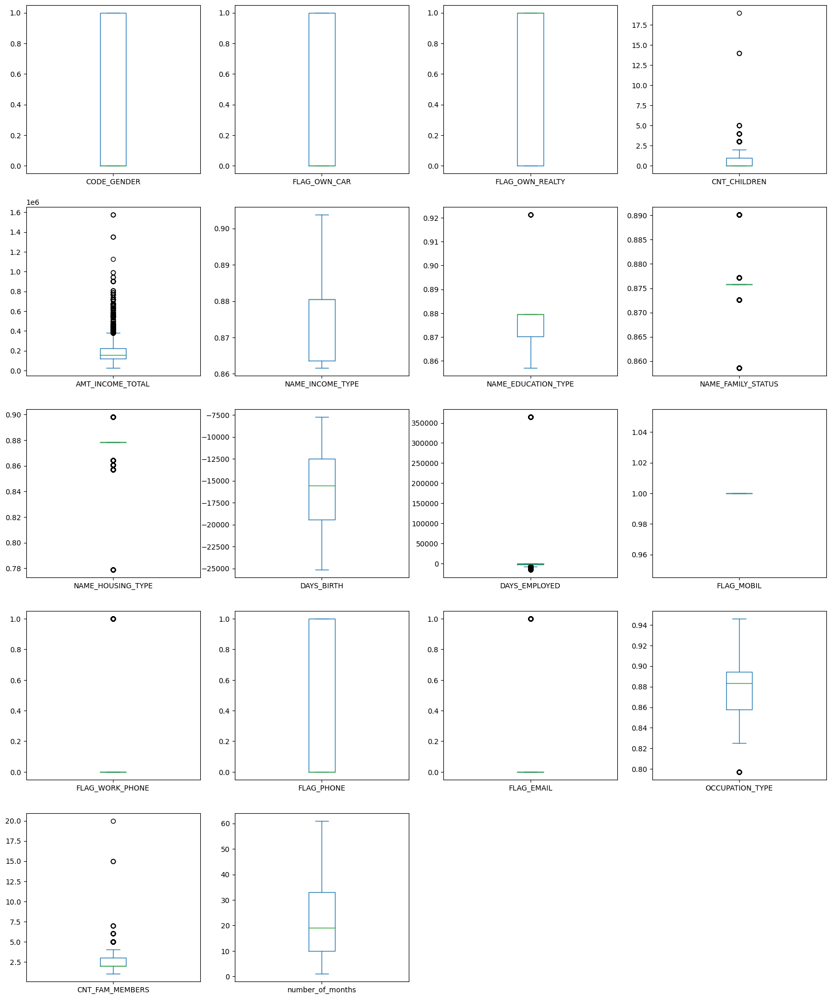

In [96]:
x_encoded.plot(kind='box', subplots=True, layout=(10,4), sharex=True, sharey=False, figsize=(20, 50))
plt.show()

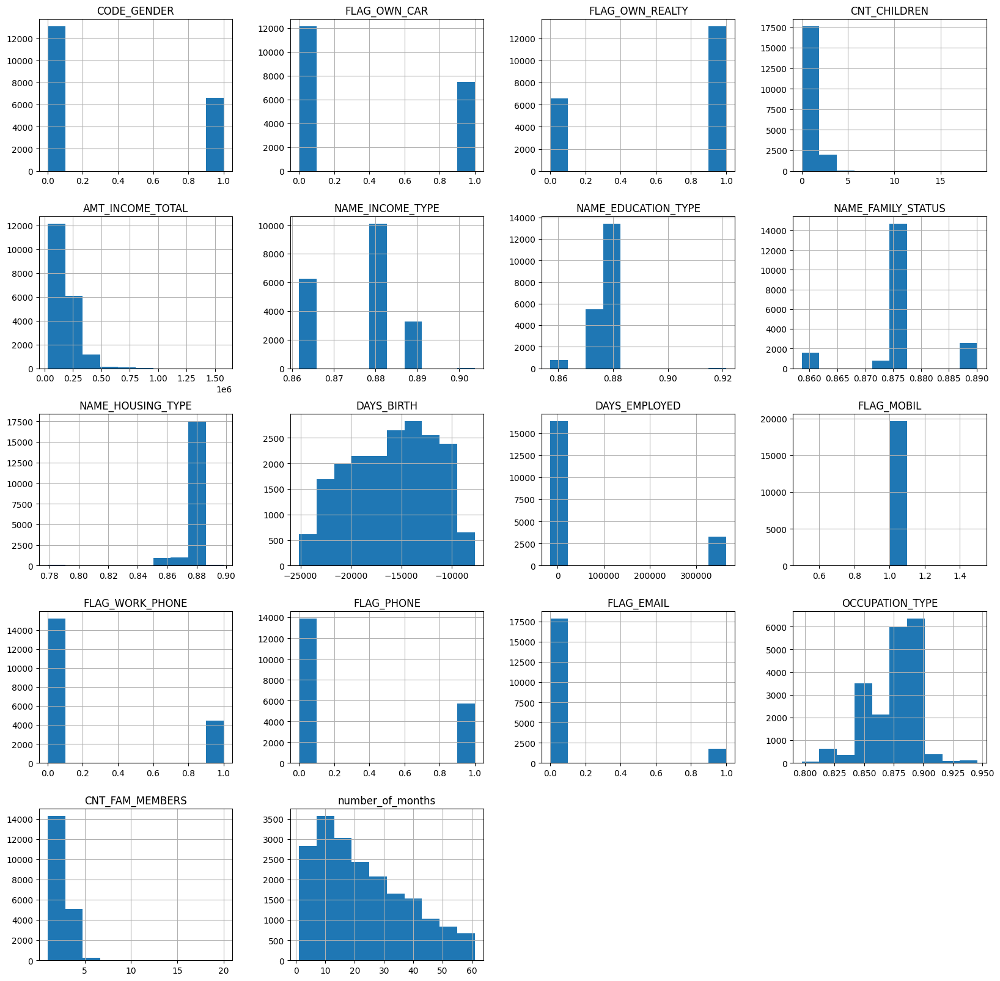

In [97]:
x_encoded.hist(figsize=(20, 20))
plt.show()

In [155]:
# create a copy of the label and the features
#label = y_train.copy()
#features_z = x_encoded.copy()

# Remove outliers using the Z-Score method
#z_scores = np.abs(stats.zscore(features_z))
#z_scores = z_scores.drop(['FLAG_MOBIL'],axis=1)
#features_z = features_z[(z_scores < 3).all(axis=1)]

# Get the cleaned feature indices
#cleaned_feature_indices = features_z.index

# Combine the target with the cleaned feature index
#y_encoded = label.loc[cleaned_feature_indices]
#features_z.reset_index()

# Print the number of rows in the dataframe before and after Z-Score outlier removal
#print("PRE Z-SCORE OUTLIER REMOVAL ROWS: {}".format(x_encoded.shape[0]))
#print("POST Z-SCORE OUTLIER REMOVAL ROWS: {}".format(features_z.shape[0]))

PRE Z-SCORE OUTLIER REMOVAL ROWS: 19658
POST Z-SCORE OUTLIER REMOVAL ROWS: 15751


In [98]:
# also tried with IQR method for outliers issue
# create a copy of the label and the features
label_iqr = y_train.copy()
features_iqr = x_encoded.copy()

def remove_outliers_iqr(data, factor=5):
    q1, q3 = np.percentile(data, [10, 90])
    iqr = q3 - q1
    lower_bound = q1 - factor * iqr
    upper_bound = q3 + factor * iqr
    mask = (data >= lower_bound) & (data <= upper_bound)
    return data[mask]

# Remove outliers using IQR method
rmfeatures_iqr = features_iqr.apply(remove_outliers_iqr, axis=0)

iqr_out = rmfeatures_iqr.dropna()

iqr_out

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5008804,1,1,1,0.0,427500.0,0.880476,0.870173,0.858619,0.860691,-12005,-4542,1,1,0,0.0,0.894205,2.0,16
5008805,1,1,1,0.0,427500.0,0.880476,0.870173,0.858619,0.860691,-12005,-4542,1,1,0,0.0,0.894205,2.0,15
5008806,1,1,1,0.0,112500.0,0.880476,0.879614,0.875768,0.878341,-21474,-1134,1,0,0,0.0,0.895042,2.0,30
5008812,0,0,1,0.0,283500.0,0.889313,0.870173,0.877171,0.878341,-22464,365243,1,0,0,0.0,0.894205,1.0,17
5008819,1,1,1,0.0,135000.0,0.863596,0.879614,0.875768,0.878341,-17778,-1194,1,0,0,0.0,0.883354,2.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5150478,1,1,1,0.0,202500.0,0.880476,0.879614,0.858619,0.878341,-10886,-1315,1,1,0,0.0,0.883354,2.0,14
5150480,0,1,1,1.0,157500.0,0.880476,0.879614,0.875768,0.878341,-10808,-1739,1,0,0,0.0,0.875505,3.0,26
5150483,0,1,1,1.0,157500.0,0.880476,0.879614,0.875768,0.878341,-10808,-1739,1,0,0,0.0,0.875505,3.0,18


In [99]:
cleaned_iqr_indices = iqr_out.index

# Combine the target with the cleaned index
y_encoded = y_train.loc[cleaned_iqr_indices]
iqr_out.reset_index()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
0,5008804,1,1,1,0.0,427500.0,0.880476,0.870173,0.858619,0.860691,-12005,-4542,1,1,0,0.0,0.894205,2.0,16
1,5008805,1,1,1,0.0,427500.0,0.880476,0.870173,0.858619,0.860691,-12005,-4542,1,1,0,0.0,0.894205,2.0,15
2,5008806,1,1,1,0.0,112500.0,0.880476,0.879614,0.875768,0.878341,-21474,-1134,1,0,0,0.0,0.895042,2.0,30
3,5008812,0,0,1,0.0,283500.0,0.889313,0.870173,0.877171,0.878341,-22464,365243,1,0,0,0.0,0.894205,1.0,17
4,5008819,1,1,1,0.0,135000.0,0.863596,0.879614,0.875768,0.878341,-17778,-1194,1,0,0,0.0,0.883354,2.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17799,5150478,1,1,1,0.0,202500.0,0.880476,0.879614,0.858619,0.878341,-10886,-1315,1,1,0,0.0,0.883354,2.0,14
17800,5150480,0,1,1,1.0,157500.0,0.880476,0.879614,0.875768,0.878341,-10808,-1739,1,0,0,0.0,0.875505,3.0,26
17801,5150483,0,1,1,1.0,157500.0,0.880476,0.879614,0.875768,0.878341,-10808,-1739,1,0,0,0.0,0.875505,3.0,18
17802,5150484,0,1,1,1.0,157500.0,0.880476,0.879614,0.875768,0.878341,-10808,-1739,1,0,0,0.0,0.875505,3.0,13


In [100]:
iqr_out.corr(method = 'spearman')

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
CODE_GENDER,1.000000,0.376688,-0.041232,0.095352,0.250779,-0.082571,-0.016427,0.025174,-0.023294,0.210247,-0.054010,NaN,0.064126,-0.027919,NaN,-0.024307,0.127072,0.014707
FLAG_OWN_CAR,0.376688,1.000000,-0.002712,0.101257,0.245924,-0.108473,-0.090885,-0.031780,0.006142,0.160315,-0.095503,NaN,0.031837,-0.018358,NaN,-0.140815,0.159427,0.032220
FLAG_OWN_REALTY,-0.041232,-0.002712,1.000000,-0.016518,0.034717,0.069502,0.031041,-0.004290,0.170205,-0.149448,0.059191,NaN,-0.208161,-0.064466,NaN,0.036094,-0.016152,-0.020046
CNT_CHILDREN,0.095352,0.101257,-0.016518,1.000000,0.043032,-0.179767,-0.056912,-0.060578,-0.013179,0.396010,-0.146791,NaN,0.051541,-0.024953,NaN,-0.164913,0.825025,-0.003887
AMT_INCOME_TOTAL,0.250779,0.245924,0.034717,0.043032,1.000000,-0.225763,-0.217417,0.035695,0.017434,0.105511,-0.167225,NaN,-0.049063,-0.007687,NaN,-0.180091,0.025893,0.037232
NAME_INCOME_TYPE,-0.082571,-0.108473,0.069502,-0.179767,-0.225763,1.000000,0.154651,-0.037195,0.050799,-0.423161,0.498180,NaN,-0.129409,0.005406,NaN,0.378107,-0.160960,-0.020089
NAME_EDUCATION_TYPE,-0.016427,-0.090885,0.031041,-0.056912,-0.217417,0.154651,1.000000,-0.063691,0.015572,-0.186261,0.052527,NaN,-0.028810,-0.044563,NaN,0.133365,-0.038037,-0.019731
NAME_FAMILY_STATUS,0.025174,-0.031780,-0.004290,-0.060578,0.035695,-0.037195,-0.063691,1.000000,-0.057537,0.083255,-0.021246,NaN,-0.014667,-0.013208,NaN,-0.017808,-0.381905,-0.018491
NAME_HOUSING_TYPE,-0.023294,0.006142,0.170205,-0.013179,0.017434,0.050799,0.015572,-0.057537,1.000000,-0.157390,-0.000671,NaN,-0.017721,0.017488,NaN,0.009883,0.017699,0.022621
DAYS_BIRTH,0.210247,0.160315,-0.149448,0.396010,0.105511,-0.423161,-0.186261,0.083255,-0.157390,1.000000,-0.229595,NaN,0.187434,-0.036682,NaN,-0.332279,0.317627,-0.055722


In [101]:
iqr_out.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17804 entries, 5008804 to 5150487
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          17804 non-null  int64  
 1   FLAG_OWN_CAR         17804 non-null  int64  
 2   FLAG_OWN_REALTY      17804 non-null  int64  
 3   CNT_CHILDREN         17804 non-null  float64
 4   AMT_INCOME_TOTAL     17804 non-null  float64
 5   NAME_INCOME_TYPE     17804 non-null  float64
 6   NAME_EDUCATION_TYPE  17804 non-null  float64
 7   NAME_FAMILY_STATUS   17804 non-null  float64
 8   NAME_HOUSING_TYPE    17804 non-null  float64
 9   DAYS_BIRTH           17804 non-null  int64  
 10  DAYS_EMPLOYED        17804 non-null  int64  
 11  FLAG_MOBIL           17804 non-null  int64  
 12  FLAG_WORK_PHONE      17804 non-null  int64  
 13  FLAG_PHONE           17804 non-null  int64  
 14  FLAG_EMAIL           17804 non-null  float64
 15  OCCUPATION_TYPE      17804 n

In [102]:
#filter method - Chi-Squared
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif


In [103]:
#feature extraction
test = SelectKBest(score_func=f_classif, k= 5)
fit = test.fit(iqr_out, y_encoded)

In [104]:
#summarize scores
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(iqr_out.columns)

In [105]:
#summarize selected features
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','F-value'] 
print(featureScores.nlargest(30,'F-value')) 

                Feature    F-value
4      AMT_INCOME_TOTAL  25.272473
17     number_of_months  15.606124
15      OCCUPATION_TYPE  14.858031
13           FLAG_PHONE   5.417341
2       FLAG_OWN_REALTY   3.855622
5      NAME_INCOME_TYPE   3.783021
9            DAYS_BIRTH   2.960034
1          FLAG_OWN_CAR   2.480235
16      CNT_FAM_MEMBERS   2.438538
8     NAME_HOUSING_TYPE   1.802903
10        DAYS_EMPLOYED   1.768508
3          CNT_CHILDREN   1.641351
7    NAME_FAMILY_STATUS   0.652669
0           CODE_GENDER   0.199174
12      FLAG_WORK_PHONE   0.163142
6   NAME_EDUCATION_TYPE   0.000295
11           FLAG_MOBIL        NaN
14           FLAG_EMAIL        NaN


In [106]:
#wrapper method - RFE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [107]:
# Feature extraction
model = LogisticRegression(solver='liblinear')
rfe = RFE(model, n_features_to_select=5)
fit = rfe.fit(iqr_out, y_encoded)
selected = pd.DataFrame(fit.support_)
dfcolumns = pd.DataFrame(iqr_out.columns)
rankings = pd.DataFrame(fit.ranking_)
choosenwrap = pd.concat([dfcolumns,selected,rankings],axis=1)
choosenwrap.columns = ['Feature','RFE_Selected','RFE_Ranks'] 
print(choosenwrap.nlargest(30,'RFE_Ranks')) 

                Feature  RFE_Selected  RFE_Ranks
14           FLAG_EMAIL         False         14
13           FLAG_PHONE         False         13
1          FLAG_OWN_CAR         False         12
0           CODE_GENDER         False         11
12      FLAG_WORK_PHONE         False         10
2       FLAG_OWN_REALTY         False          9
3          CNT_CHILDREN         False          8
8     NAME_HOUSING_TYPE         False          7
6   NAME_EDUCATION_TYPE         False          6
5      NAME_INCOME_TYPE         False          5
7    NAME_FAMILY_STATUS         False          4
15      OCCUPATION_TYPE         False          3
11           FLAG_MOBIL         False          2
16      CNT_FAM_MEMBERS          True          1
9            DAYS_BIRTH          True          1
10        DAYS_EMPLOYED          True          1
4      AMT_INCOME_TOTAL          True          1
17     number_of_months          True          1


In [114]:
#extra trees forest
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier(n_estimators=7)
model.fit(iqr_out, y_encoded)
feature_importances = pd.DataFrame(model.feature_importances_)
featuretree = pd.concat([dfcolumns,feature_importances],axis=1)
featuretree.columns = ['Feature','XTree_Classifier'] 
print(featuretree.nlargest(30,'XTree_Classifier'))

                Feature  XTree_Classifier
17     number_of_months          0.356150
9            DAYS_BIRTH          0.135461
4      AMT_INCOME_TOTAL          0.115346
10        DAYS_EMPLOYED          0.089298
15      OCCUPATION_TYPE          0.069030
6   NAME_EDUCATION_TYPE          0.034585
7    NAME_FAMILY_STATUS          0.032636
16      CNT_FAM_MEMBERS          0.029020
5      NAME_INCOME_TYPE          0.028472
3          CNT_CHILDREN          0.021699
8     NAME_HOUSING_TYPE          0.018579
1          FLAG_OWN_CAR          0.017420
0           CODE_GENDER          0.017404
12      FLAG_WORK_PHONE          0.015100
2       FLAG_OWN_REALTY          0.012696
13           FLAG_PHONE          0.007103
11           FLAG_MOBIL          0.000000
14           FLAG_EMAIL          0.000000


In [115]:
dff=pd.merge(featureScores, choosenwrap, on=["Feature"])
feature_selection_df = pd.merge(dff, featuretree, on=["Feature"])
feature_selection_df.sort_values(by="XTree_Classifier",ascending=False)

,Feature,F-value,RFE_Selected,RFE_Ranks,XTree_Classifier
17,number_of_months,15.606124,True,1,0.356150
9,DAYS_BIRTH,2.960034,True,1,0.135461
4,AMT_INCOME_TOTAL,25.272473,True,1,0.115346
10,DAYS_EMPLOYED,1.768508,True,1,0.089298
15,OCCUPATION_TYPE,14.858031,False,3,0.069030
6,NAME_EDUCATION_TYPE,0.000295,False,6,0.034585
7,NAME_FAMILY_STATUS,0.652669,False,4,0.032636
16,CNT_FAM_MEMBERS,2.438538,True,1,0.029020
5,NAME_INCOME_TYPE,3.783021,False,5,0.028472
3,CNT_CHILDREN,1.641351,False,8,0.021699


In [116]:
#features with low scores in all three methods (i.e. low F-value, high RFE rank, and low Extra Trees score) are good candidates for dropping. 
processed_train = iqr_out.drop(['FLAG_EMAIL','FLAG_MOBIL','NAME_EDUCATION_TYPE','CNT_CHILDREN'], axis=1)

<AxesSubplot: >

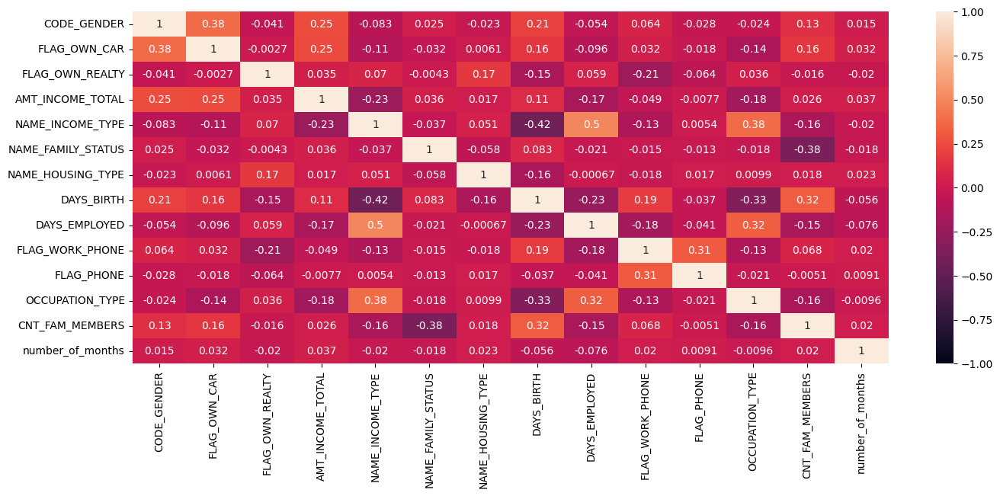

In [117]:
plt.figure(figsize=(16, 6))
sns.heatmap(processed_train.corr(method='spearman'),vmin=-1, vmax=1, annot=True)

In [118]:
processed_train.skew()

CODE_GENDER           0.699851
FLAG_OWN_CAR          0.510631
FLAG_OWN_REALTY      -0.667234
AMT_INCOME_TOTAL      2.152479
NAME_INCOME_TYPE     -0.442024
NAME_FAMILY_STATUS   -0.239476
NAME_HOUSING_TYPE    -2.096275
DAYS_BIRTH           -0.145817
DAYS_EMPLOYED         1.687398
FLAG_WORK_PHONE       1.277983
FLAG_PHONE            0.916128
OCCUPATION_TYPE      -0.568827
CNT_FAM_MEMBERS       0.886523
number_of_months      0.630116
dtype: float64

In [119]:
processed_train.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
count,17804.000000,17804.000000,17804.000000,1.780400e+04,17804.000000,17804.000000,17804.000000,17804.000000,17804.000000,17804.000000,17804.000000,17804.000000,17804.000000,17804.000000
mean,0.334869,0.376320,0.658223,1.835171e+05,0.876684,0.876217,0.876823,-16116.180353,62614.247641,0.230791,0.291788,0.876421,2.195462,22.520108
std,0.471958,0.484475,0.474319,9.661892e+04,0.009650,0.007102,0.005458,4184.575017,140600.554325,0.421351,0.454598,0.021226,0.896854,15.198475
min,0.000000,0.000000,0.000000,2.700000e+04,0.861668,0.858619,0.857091,-25152.000000,-15713.000000,0.000000,0.000000,0.797246,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.170000e+05,0.863596,0.875768,0.878341,-19591.250000,-3170.000000,0.000000,0.000000,0.857851,2.000000,10.000000
50%,0.000000,0.000000,1.000000,1.575000e+05,0.880476,0.875768,0.878341,-15789.000000,-1557.000000,0.000000,0.000000,0.883354,2.000000,19.000000
75%,1.000000,1.000000,1.000000,2.250000e+05,0.880476,0.875768,0.878341,-12659.750000,-383.000000,0.000000,1.000000,0.894205,3.000000,33.000000
max,1.000000,1.000000,1.000000,1.125000e+06,0.903767,0.890130,0.898261,-7757.000000,365243.000000,1.000000,1.000000,0.945869,7.000000,61.000000


In [120]:
#prepare test dataset
#missing values
x_test['OCCUPATION_TYPE'].fillna('Other',inplace=True)
#target encoding
x_test_encoded=target.transform(x_test)
#one-hot encoding
for x in x_test_encoded:
    if x_test_encoded[x].dtypes=='object':
        x_test_encoded[x] = le.fit_transform(x_test_encoded[x])
#drop features
x_test_encoded=x_test_encoded.drop(['FLAG_EMAIL','FLAG_MOBIL','NAME_EDUCATION_TYPE','CNT_CHILDREN'],axis=1)

In [121]:
x_train = processed_train.copy()
y_train = y_encoded.copy()
x_test = x_test_encoded.copy()

In [122]:
print(x_test.shape)
print(x_train.shape)
print(y_test.shape)
print(y_train.shape)

(8425, 14)
(17804, 14)
(8425,)
(17804,)


In [123]:
#modeling - Logistic Regression, K-Nearest Neighbors, Support Vector Machine (SVM), Decision Tree, Random Forest
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import *
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.compose import make_column_transformer
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import RobustScaler
from pprint import pprint
from sklearn.pipeline import make_pipeline

1st modeling with random parameters and saving all evaluation metrics

In [146]:
%%time
#Logistic Regression
lr = LogisticRegression(class_weight= {0:0.77,1:0.23},C=1)
lr.fit(x_train, y_train)
train_pred = lr.predict(x_train)
test_pred = lr.predict(x_test)
trainproba = lr.predict_proba(x_train)[:,1]
testproba = lr.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

   0     1
0  0  1088
1  3  7334
CPU times: user 80.7 ms, sys: 4.79 ms, total: 85.5 ms
Wall time: 200 ms


In [147]:
#calculate train accuracy 
lr_train_accuracy = accuracy_score(y_train,train_pred)
lr_train_precision = precision_score(y_train,train_pred)
lr_train_recall = recall_score(y_train,train_pred)
lr_train_f1 = f1_score(y_train,train_pred)
lr_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
lr_test_accuracy = accuracy_score(y_test,test_pred)
lr_test_precision = precision_score(y_test,test_pred)
lr_test_recall = recall_score(y_test,test_pred)
lr_test_f1 = f1_score(y_test,test_pred)
lr_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.87576
Train precision score = 0.87576
Train recall score = 1.0
Train F1 score = 0.93376
Train AUC score = 0.51837
Test accuracy score = 0.8705
Test precision score = 0.87081
Test recall score = 0.99959
Test F1 score = 0.93077
Test AUC score = 0.51449
CPU times: user 104 ms, sys: 6.46 ms, total: 110 ms
Wall time: 135 ms


In [148]:
#store the result
lr_results = pd.DataFrame(['Logistic Regression',lr_train_accuracy, lr_train_precision, 
                           lr_train_recall, lr_train_f1, lr_train_auc, lr_test_accuracy, lr_test_precision,
                           lr_test_recall, lr_test_f1, lr_test_auc]).transpose()
lr_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [149]:
%%time
#knn
knn = KNeighborsClassifier(p=1, weights='distance')
knn.fit(x_train, y_train)
train_pred = knn.predict(x_train)
test_pred = knn.predict(x_test)
trainproba = knn.predict_proba(x_train)[:,1]
testproba = knn.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

     0     1
0  223   865
1  556  6781
CPU times: user 818 ms, sys: 26.6 ms, total: 845 ms
Wall time: 1.29 s


In [150]:
#calculate train accuracy 
knn_train_accuracy = accuracy_score(y_train,train_pred)
knn_train_precision = precision_score(y_train,train_pred)
knn_train_recall = recall_score(y_train,train_pred)
knn_train_f1 = f1_score(y_train,train_pred)
knn_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
knn_test_accuracy = accuracy_score(y_test,test_pred)
knn_test_precision = precision_score(y_test,test_pred)
knn_test_recall = recall_score(y_test,test_pred)
knn_test_f1 = f1_score(y_test,test_pred)
knn_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.98309
Train precision score = 1.0
Train recall score = 0.9807
Train F1 score = 0.99025
Train AUC score = 0.99869
Test accuracy score = 0.83134
Test precision score = 0.88687
Test recall score = 0.92422
Test F1 score = 0.90516
Test AUC score = 0.59702


In [151]:
knn_results = pd.DataFrame(['K-Nearest Neighbors',knn_train_accuracy, knn_train_precision, 
                           knn_train_recall, knn_train_f1, knn_train_auc, knn_test_accuracy, knn_test_precision,
                           knn_test_recall, knn_test_f1, knn_test_auc]).transpose()
knn_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [152]:
%%time
#Decision Tree
dt = DecisionTreeClassifier(criterion="entropy")
dt.fit(x_train, y_train)
train_pred = dt.predict(x_train)
test_pred = dt.predict(x_test)
trainproba = dt.predict_proba(x_train)[:,1]
testproba = dt.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

     0     1
0  219   869
1  955  6382
CPU times: user 171 ms, sys: 6.91 ms, total: 178 ms
Wall time: 238 ms


In [153]:
#calculate train accuracy 
dt_train_accuracy = accuracy_score(y_train,train_pred)
dt_train_precision = precision_score(y_train,train_pred)
dt_train_recall = recall_score(y_train,train_pred)
dt_train_f1 = f1_score(y_train,train_pred)
dt_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
dt_test_accuracy = accuracy_score(y_test,test_pred)
dt_test_precision = precision_score(y_test,test_pred)
dt_test_recall = recall_score(y_test,test_pred)
dt_test_f1 = f1_score(y_test,test_pred)
dt_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.98309
Train precision score = 1.0
Train recall score = 0.9807
Train F1 score = 0.99025
Train AUC score = 0.99869
Test accuracy score = 0.7835
Test precision score = 0.88015
Test recall score = 0.86984
Test F1 score = 0.87497
Test AUC score = 0.53542


In [154]:
dt_results = pd.DataFrame(['Decision Tree',dt_train_accuracy, dt_train_precision, 
                           dt_train_recall, dt_train_f1, dt_train_auc, dt_test_accuracy, dt_test_precision,
                           dt_test_recall, dt_test_f1, dt_test_auc]).transpose()
dt_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [155]:
%%time
#Random Forest
rf = RandomForestClassifier(n_estimators=1000,max_depth=20,random_state = 80)
rf.fit(x_train, y_train)
train_pred = rf.predict(x_train)
test_pred = rf.predict(x_test)
trainproba = rf.predict_proba(x_train)[:,1]
testproba = rf.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

     0     1
0   57  1031
1  124  7213
CPU times: user 28.9 s, sys: 513 ms, total: 29.4 s
Wall time: 33.9 s


In [143]:
#calculate train accuracy 
rf_train_accuracy = accuracy_score(y_train,train_pred)
rf_train_precision = precision_score(y_train,train_pred)
rf_train_recall = recall_score(y_train,train_pred)
rf_train_f1 = f1_score(y_train,train_pred)
rf_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
rf_test_accuracy = accuracy_score(y_test,test_pred)
rf_test_precision = precision_score(y_test,test_pred)
rf_test_recall = recall_score(y_test,test_pred)
rf_test_f1 = f1_score(y_test,test_pred)
rf_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.93676
Train precision score = 0.93301
Train recall score = 0.99955
Train F1 score = 0.96514
Train AUC score = 0.9947
Test accuracy score = 0.86291
Test precision score = 0.87494
Test recall score = 0.9831
Test F1 score = 0.92587
Test AUC score = 0.66934


In [144]:
rf_results = pd.DataFrame(['Random Forest',rf_train_accuracy, rf_train_precision, 
                           rf_train_recall, rf_train_f1, rf_train_auc, rf_test_accuracy, rf_test_precision,
                           rf_test_recall, rf_test_f1, rf_test_auc]).transpose()
rf_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [160]:
%%time
#SVC
svc = SVC(probability=True)
svc.fit(x_train, y_train)
train_pred = svc.predict(x_train)
test_pred = svc.predict(x_test)
trainproba = svc.predict_proba(x_train)[:,1]
testproba = svc.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

   0     1
0  0  1088
1  0  7337
CPU times: user 1min 7s, sys: 1.82 s, total: 1min 9s
Wall time: 1min 13s


In [161]:
#calculate train accuracy 
svc_train_accuracy = accuracy_score(y_train,train_pred)
svc_train_precision = precision_score(y_train,train_pred)
svc_train_recall = recall_score(y_train,train_pred)
svc_train_f1 = f1_score(y_train,train_pred)
svc_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
svc_test_accuracy = accuracy_score(y_test,test_pred)
svc_test_precision = precision_score(y_test,test_pred)
svc_test_recall = recall_score(y_test,test_pred)
svc_test_f1 = f1_score(y_test,test_pred)
svc_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.87576
Train precision score = 0.87576
Train recall score = 1.0
Train F1 score = 0.93376
Train AUC score = 0.50392
Test accuracy score = 0.87086
Test precision score = 0.87086
Test recall score = 1.0
Test F1 score = 0.93097
Test AUC score = 0.50882


In [162]:
svc_results = pd.DataFrame(['SVC',svc_train_accuracy, svc_train_precision, 
                           svc_train_recall, svc_train_f1, svc_train_auc, svc_test_accuracy, svc_test_precision,
                           svc_test_recall, svc_test_f1, svc_test_auc]).transpose()

svc_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [163]:
model_result = pd.concat([lr_results, knn_results, dt_results, rf_results, svc_results])

In [183]:
model_result

,Classifier,Train_accuracy,Train_presicion,Train_recall,Train_f1,Train_AUC,Test_accuracy,Test_presicion,Test_recall,Test_f1,Test_AUC
0,Logistic Regression,0.875758,0.875758,1.0,0.933765,0.518369,0.870504,0.870815,0.999591,0.93077,0.514488
0,K-Nearest Neighbors,0.983094,1.0,0.980695,0.990254,0.998687,0.831335,0.886869,0.92422,0.905159,0.597021
0,Decision Tree,0.983094,1.0,0.980695,0.990254,0.998687,0.783501,0.880154,0.869838,0.874966,0.535421
0,Random Forest,0.936756,0.93301,0.999551,0.965135,0.994698,0.862908,0.874939,0.983099,0.925871,0.669341
0,SVC,0.875758,0.875758,1.0,0.933765,0.503916,0.870861,0.870861,1.0,0.930973,0.508824


In [165]:
model_train_result = model_result.iloc[:,:6]
model_test_result = model_result.drop(['Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC'], axis=1)

In [184]:
model_train_result

,Train_accuracy,Train_presicion,Train_recall,Train_f1,Train_AUC
Classifier,,,,,
Logistic Regression,0.875758,0.875758,1.0,0.933765,0.518369
K-Nearest Neighbors,0.983094,1.0,0.980695,0.990254,0.998687
Decision Tree,0.983094,1.0,0.980695,0.990254,0.998687
Random Forest,0.936756,0.93301,0.999551,0.965135,0.994698
SVC,0.875758,0.875758,1.0,0.933765,0.503916


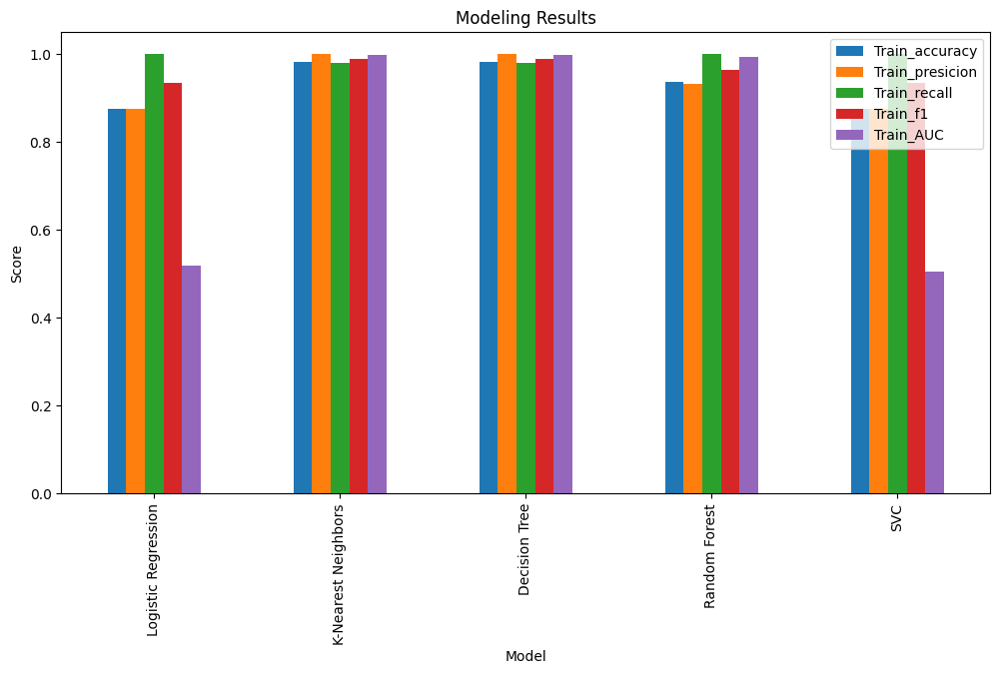

In [167]:
# Set the model names as the index
model_train_result.set_index('Classifier', inplace=True)

# Plot the results
fig, ax = plt.subplots(figsize=(12,6))
model_train_result.plot(kind='bar', ax=ax)
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Modeling Results')
plt.show()

In [185]:
model_test_result

,Classifier,Test_accuracy,Test_presicion,Test_recall,Test_f1,Test_AUC
0,Logistic Regression,0.870504,0.870815,0.999591,0.93077,0.514488
0,K-Nearest Neighbors,0.831335,0.886869,0.92422,0.905159,0.597021
0,Decision Tree,0.783501,0.880154,0.869838,0.874966,0.535421
0,Random Forest,0.862908,0.874939,0.983099,0.925871,0.669341
0,SVC,0.870861,0.870861,1.0,0.930973,0.508824


Note: 

1st modeling shows that the AUC is lower on LR and SVC for the training set. The result on other evaluation metrics are quite high, it might be overfitting still. The testing result on accuracy, presicion, recall, and f1 on all models are over 70, but AUC on all models are below 70. The highest accuracy model are LR and SVC with 87.4, the highest presicion are Knn and DT with 88.7, the highest recall are LR and SVC at 100, the highest F1 are LR and SVC with 93.2, the highest AUC is RF with 66.9

LR and SVC appear to have a lower training accuracy and precision, but their performance on the test data is more consistent with their performance on the training data, indicated they are less likely to overfit compared to the other classifiers.

Overall, based on the results, it seems that the LR and SVC may be a better choice for this research problem, as they appear to be more robust to overfitting and have better performance on the testing set.

2nd modeling with scaling, to test if it affects the accuracy of each model

In [182]:
%%time
classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="rbf", C=0.025, probability=True),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    LogisticRegression()
]
scalers = {
    'PowerTransformer': PowerTransformer(method="yeo-johnson"),
    'QuantileTransformer': QuantileTransformer(),
    'RobustScaler': RobustScaler()
}

model2 = pd.DataFrame(columns=['PowerTransformer', 'QuantileTransformer', 'RobustScaler'])

for classifier in classifiers:
    classifier_results = {}
    for scaler_name, scaler in scalers.items():
        steps = [('preprocess', scaler), ('clf', classifier)]
        pipeline = Pipeline(steps)
        pipeline.fit(x_train, y_train)
        score = pipeline.score(x_test, y_test)
        classifier_results[scaler_name] = score
    model2.loc[type(classifier).__name__] = classifier_results

print(model2)

                        PowerTransformer  QuantileTransformer  RobustScaler
KNeighborsClassifier            0.846409             0.846647      0.842849
SVC                             0.870861             0.870861      0.870861
DecisionTreeClassifier          0.780415             0.780178      0.784451
RandomForestClassifier          0.848665             0.848902      0.847122
LogisticRegression              0.870861             0.870861      0.870861
CPU times: user 2min 55s, sys: 6.5 s, total: 3min 1s
Wall time: 3min 57s


Note: 

2nd modeling with different method of scaling(PowerTransformer, QuantileTransformer, and RobustScaler) resulted in similar model performance across the five classifiers. The best-performing classifiers in terms of accuracy were SVC and Logistic Regression, which achieved the highest score of 87.08 across all three scalers, also had consistent performance across all three scalers. KNeighborsClassifier had a relatively lower accuracy score compared to the other classifiers, ranging from 84.28 to 84.66 depending on the scaler used. The DecisionTreeClassifier had the lowest accuracy score, ranging from 78.01 to 78.44 depending on the scaler used, also worth mentioning that RobustScaler on DT boosted 0.4% on accuracy. Unlike KNN, applying RobustScaler dropped 0.4% accuracy. KNN and DT are more sensitive to scaler in 2nd modeling.

#3rd modeling - hyperparameter scaling modeling randomsearchcv repeated stratifired k-fold timer

In [180]:
#Random Forest Classifier
%%time
steps = [
    ('scaler', RobustScaler()),
    ('rf', RandomForestClassifier())]
pipeline = Pipeline(steps=steps)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=12)
from pprint import pprint
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [8, 10, 12]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
criterion = ['gini', 'entropy', 'log_loss']
# Create the random grid
random_grid = {'rf__n_estimators': n_estimators,
               'rf__max_features': max_features,
               'rf__max_depth': max_depth,
               'rf__min_samples_split': min_samples_split,
               'rf__min_samples_leaf': min_samples_leaf,
               'rf__bootstrap': bootstrap,
               'rf__criterion': criterion}
pprint(random_grid)
ran_rf = RandomizedSearchCV(pipeline, random_grid,cv=cv, n_jobs=-1, scoring='roc_auc',n_iter=8)

{'rf__bootstrap': [True, False],
 'rf__criterion': ['gini', 'entropy', 'log_loss'],
 'rf__max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'rf__max_features': ['auto', 'sqrt', 'log2'],
 'rf__min_samples_leaf': [1, 2, 4],
 'rf__min_samples_split': [8, 10, 12],
 'rf__n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [181]:
%%time
ran_rf.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the pas

CPU times: user 35.9 s, sys: 832 ms, total: 36.7 s
Wall time: 13min 39s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                             ('rf', RandomForestClassifier())]),
                   n_iter=8, n_jobs=-1,
                   param_distributions={'rf__bootstrap': [True, False],
                                        'rf__criterion': ['gini', 'entropy',
                                                          'log_loss'],
                                        'rf__max_depth': [10, 20, 30, 40, 50,
                                                          60, 70, 80, 90, 100,
                                                          110, None],
                                        'rf__max_features': ['auto', 'sqrt',
                                                             'log2'],
                                        'rf__min_samples_leaf': [1, 2, 4],
                                        'rf__min_samples_split': [8, 10, 12],
                                        'rf__n_estimators': [200, 400, 600, 800,
                                                             1000, 1200, 1400,
                                                             1600, 1800,
                                                             2000]},
                   scoring='roc_auc')

In [186]:
ran_rf.best_params_

{'rf__n_estimators': 1800,
 'rf__min_samples_split': 12,
 'rf__min_samples_leaf': 1,
 'rf__max_features': 'auto',
 'rf__max_depth': 20,
 'rf__criterion': 'entropy',
 'rf__bootstrap': True}

In [187]:
ran_rf.best_score_

0.6675983695447065

#4th modeling - final compare with the best parameters

In [189]:
%%time
rf2 = RandomForestClassifier(
                           n_estimators = ran_rf.best_params_['rf__n_estimators'],
                           max_features = ran_rf.best_params_['rf__max_features'],
                           max_depth = ran_rf.best_params_['rf__max_depth'],
                           bootstrap = ran_rf.best_params_['rf__bootstrap'],
                           min_samples_leaf = ran_rf.best_params_['rf__min_samples_leaf'],
                           min_samples_split = ran_rf.best_params_['rf__min_samples_split'],
                           criterion = ran_rf.best_params_['rf__criterion'],
                           random_state = 0)
    
rf2.fit(x_train, y_train)

n_scores = cross_val_score(rf2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.66094648 0.66739579 0.67816849 0.67451823 0.66214855 0.66353752
 0.66697761 0.67736054 0.66921733 0.65565836]
Average CV Score:  0.6675928906473223
Number of CV Scores used in Average:  10
CPU times: user 5min 25s, sys: 4.92 s, total: 5min 30s
Wall time: 5min 49s


In [190]:
train_pred = rf2.predict(x_train)
test_pred = rf2.predict(x_test)
trainproba = rf2.predict_proba(x_train)[:,1]
testproba = rf2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
rf2_train_accuracy = accuracy_score(y_train,train_pred)
rf2_train_precision = precision_score(y_train,train_pred)
rf2_train_recall = recall_score(y_train,train_pred)
rf2_train_f1 = f1_score(y_train,train_pred)
rf2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
rf2_test_accuracy = accuracy_score(y_test,test_pred)
rf2_test_precision = precision_score(y_test,test_pred)
rf2_test_recall = recall_score(y_test,test_pred)
rf2_test_f1 = f1_score(y_test,test_pred)
rf2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

    0     1
0  16  1072
1  17  7320
Train accuracy score = 0.88334
Train precision score = 0.88297
Train recall score = 0.99923
Train F1 score = 0.93751
Train AUC score = 0.97803
Test accuracy score = 0.87074
Test precision score = 0.87226
Test recall score = 0.99768
Test F1 score = 0.93076
Test AUC score = 0.67901


In [191]:
rf2_results = pd.DataFrame(['Tuned Random Forest',rf2_train_accuracy, rf2_train_precision, 
                           rf2_train_recall, rf2_train_f1, rf2_train_auc, rf2_test_accuracy, rf2_test_precision,
                           rf2_test_recall, rf2_test_f1, rf2_test_auc]).transpose()
rf2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [192]:
steps = [
    ('scaler', RobustScaler()),
    ('lr', LogisticRegression())]
pipeline = Pipeline(steps=steps)
solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
penalty = ['none', 'l1', 'l2', 'elasticnet']
C = np.logspace(-4, 4, 20)
max_iter = [10, 100, 500, 1000, 5000]
lr_grid = {'lr__solver': solver,
           'lr__penalty': penalty,
           'lr__C': C,
           'lr__max_iter': max_iter}
pprint(lr_grid)
ran_lr = RandomizedSearchCV(pipeline, lr_grid, cv=cv, n_jobs=-1, scoring='roc_auc')

{'lr__C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
 'lr__max_iter': [10, 100, 500, 1000, 5000],
 'lr__penalty': ['none', 'l1', 'l2', 'elasticnet'],
 'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}


In [193]:
%%time
ran_lr.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increas

CPU times: user 1.28 s, sys: 213 ms, total: 1.49 s
Wall time: 2min 48s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                             ('lr', LogisticRegression())]),
                   n_jobs=-1,
                   param_distributions={'lr__C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'lr__max_iter': [10, 100, 500, 1000,
                                                         5000],
                                        'lr__penalty': ['none', 'l1', 'l2',
                                                        'elasticnet'],
                                        'lr__solver': ['newton-cg', 'lbfgs',
                                                       'liblinear', 'sag',
                                                       'saga']},
                   scoring='roc_auc')

In [194]:
ran_lr.best_params_

{'lr__solver': 'saga',
 'lr__penalty': 'l2',
 'lr__max_iter': 5000,
 'lr__C': 0.0018329807108324356}

In [195]:
ran_lr.best_score_

0.5429397455182939

In [196]:
lr2 = LogisticRegression(
                           solver = ran_lr.best_params_['lr__solver'],
                           penalty = ran_lr.best_params_['lr__penalty'],
                           C = ran_lr.best_params_['lr__C'],
                           max_iter = ran_lr.best_params_['lr__max_iter'])
    
lr2.fit(x_train, y_train)

n_scores = cross_val_score(lr2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.48549287 0.51396165 0.50459757 0.49109047 0.53478634 0.49295698
 0.51211521 0.50936708 0.51681962 0.49733448]
Average CV Score:  0.5058522252764457
Number of CV Scores used in Average:  10


In [290]:
#from imblearn.pipeline import make_pipeline
#from imblearn.over_sampling import SMOTE
#from sklearn.decomposition import PCA
#from sklearn.preprocessing import StandardScaler
#lr2 = make_pipeline(
#    PCA(n_components=2),
#    StandardScaler(),
#    SMOTE(),
#    LogisticRegression(
#        solver=ran_lr.best_params_['lr__solver'],
#        penalty=ran_lr.best_params_['lr__penalty'],
#        C=ran_lr.best_params_['lr__C'],
#        max_iter=ran_lr.best_params_['lr__max_iter']
#    )
#)
# Fit the pipeline with SMOTE and best hyperparameters
#lr2.fit(x_train, y_train)


Pipeline(steps=[('pca', PCA(n_components=2)),
                ('standardscaler', StandardScaler()), ('smote', SMOTE()),
                ('logisticregression',
                 LogisticRegression(C=29.763514416313132, max_iter=10,
                                    penalty='l1', solver='liblinear'))])

In [197]:
train_pred = lr2.predict(x_train)
test_pred = lr2.predict(x_test)
trainproba = lr2.predict_proba(x_train)[:,1]
testproba = lr2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
lr2_train_accuracy = accuracy_score(y_train,train_pred)
lr2_train_precision = precision_score(y_train,train_pred)
lr2_train_recall = recall_score(y_train,train_pred)
lr2_train_f1 = f1_score(y_train,train_pred)
lr2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
lr2_test_accuracy = accuracy_score(y_test,test_pred)
lr2_test_precision = precision_score(y_test,test_pred)
lr2_test_recall = recall_score(y_test,test_pred)
lr2_test_f1 = f1_score(y_test,test_pred)
lr2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

   0     1
0  0  1088
1  0  7337
Train accuracy score = 0.87576
Train precision score = 0.87576
Train recall score = 1.0
Train F1 score = 0.93376
Train AUC score = 0.50651
Test accuracy score = 0.87086
Test precision score = 0.87086
Test recall score = 1.0
Test F1 score = 0.93097
Test AUC score = 0.49531


In [198]:
lr2_results = pd.DataFrame(['Tuned Logistic Regression',lr2_train_accuracy, lr2_train_precision, 
                           lr2_train_recall, lr2_train_f1, lr2_train_auc, lr2_test_accuracy, lr2_test_precision,
                           lr2_test_recall, lr2_test_f1, lr2_test_auc]).transpose()
lr2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [175]:
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
from sklearn.metrics import make_scorer, accuracy_score, f1_score, roc_auc_score

scoring = {'accuracy': 'accuracy', 
           'f1_weighted': make_scorer(f1_score, average='weighted'), 
           'roc_auc': make_scorer(roc_auc_score)}

steps = [
    ('smote', SMOTE()),
    ('scaler', PowerTransformer(method="yeo-johnson")),
    ('knn', KNeighborsClassifier())
]

pipeline = Pipeline(steps=steps)

n_neighbors = range(1, 21, 2)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
p = [1, 2]

knn_grid = {'knn__n_neighbors': n_neighbors,
            'knn__weights': weights,
            'knn__metric': metric,
            'knn__p': p}

ran_knn = RandomizedSearchCV(pipeline, knn_grid, cv=cv, n_jobs=-1, scoring=scoring, refit='roc_auc')


In [176]:
%%time
ran_knn.fit(x_train, y_train)

CPU times: user 971 ms, sys: 246 ms, total: 1.22 s
Wall time: 2min 47s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('smote', SMOTE()),
                                             ('scaler', PowerTransformer()),
                                             ('knn', KNeighborsClassifier())]),
                   n_jobs=-1,
                   param_distributions={'knn__metric': ['euclidean',
                                                        'manhattan',
                                                        'minkowski'],
                                        'knn__n_neighbors': range(1, 21, 2),
                                        'knn__p': [1, 2],
                                        'knn__weights': ['uniform',
                                                         'distance']},
                   refit='roc_auc',
                   scoring={'accuracy': 'accuracy',
                            'f1_weighted': make_scorer(f1_score, average=weighted),
                            'roc_auc': make_scorer(roc_auc_score)})

In [177]:
ran_knn.best_params_

{'knn__weights': 'uniform',
 'knn__p': 1,
 'knn__n_neighbors': 5,
 'knn__metric': 'manhattan'}

In [178]:
ran_knn.best_score_

0.5665293924407279

In [199]:
knn2 = KNeighborsClassifier(
                           n_neighbors = ran_knn.best_params_['knn__n_neighbors'],
                           weights = ran_knn.best_params_['knn__weights'],
                           metric = ran_knn.best_params_['knn__metric'],
                           p = ran_knn.best_params_['knn__p'])
    
knn2.fit(x_train, y_train)

n_scores = cross_val_score(knn2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.58940569 0.56881774 0.61157236 0.62262918 0.61423743 0.60704244
 0.60746933 0.60991628 0.59379819 0.5931248 ]
Average CV Score:  0.6018013438914103
Number of CV Scores used in Average:  10


In [200]:
train_pred = knn2.predict(x_train)
test_pred = knn2.predict(x_test)
trainproba = knn2.predict_proba(x_train)[:,1]
testproba = knn2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
knn2_train_accuracy = accuracy_score(y_train,train_pred)
knn2_train_precision = precision_score(y_train,train_pred)
knn2_train_recall = recall_score(y_train,train_pred)
knn2_train_f1 = f1_score(y_train,train_pred)
knn2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
knn2_test_accuracy = accuracy_score(y_test,test_pred)
knn2_test_precision = precision_score(y_test,test_pred)
knn2_test_recall = recall_score(y_test,test_pred)
knn2_test_f1 = f1_score(y_test,test_pred)
knn2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

     0     1
0   88  1000
1  229  7108
Train accuracy score = 0.88873
Train precision score = 0.89913
Train recall score = 0.98326
Train F1 score = 0.93931
Train AUC score = 0.88227
Test accuracy score = 0.85412
Test precision score = 0.87667
Test recall score = 0.96879
Test F1 score = 0.92043
Test AUC score = 0.6095


In [201]:
knn2_results = pd.DataFrame(['Tuned K-Nearest Neighbors',knn2_train_accuracy, knn2_train_precision, 
                           knn2_train_recall, knn2_train_f1, knn2_train_auc, knn2_test_accuracy, knn2_test_precision,
                           knn2_test_recall, knn2_test_f1, knn2_test_auc]).transpose()
knn2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [208]:
#Decision Tree Classifier

steps = [
    ('scaler', RobustScaler()),
    ('dt', DecisionTreeClassifier())]
pipeline = Pipeline(steps=steps)
criterion = ['gini','entropy']
max_depth = [4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]
min_samples_split = np.arange(2, 20)
min_samples_leaf = np.arange(1, 20)
max_features = ['sqrt', 'log2', None]
dt_grid = {'dt__criterion': criterion,
           'dt__max_depth': max_depth,
           'dt__min_samples_split': min_samples_split,
           'dt__min_samples_leaf':min_samples_leaf,
           'dt__max_features':max_features}
ran_dt = RandomizedSearchCV(pipeline, dt_grid, cv=cv, n_jobs=-1, scoring='roc_auc')

In [209]:
%%time
ran_dt.fit(x_train, y_train)

CPU times: user 329 ms, sys: 110 ms, total: 439 ms
Wall time: 5.21 s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                             ('dt', DecisionTreeClassifier())]),
                   n_jobs=-1,
                   param_distributions={'dt__criterion': ['gini', 'entropy'],
                                        'dt__max_depth': [4, 5, 6, 7, 8, 9, 10,
                                                          11, 12, 15, 20, 30,
                                                          40, 50, 70, 90, 120,
                                                          150],
                                        'dt__max_features': ['sqrt', 'log2',
                                                             None],
                                        'dt__min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19]),
                                        'dt__min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19])},
                   scoring='roc_auc')

In [211]:
ran_dt.best_params_

{'dt__min_samples_split': 8,
 'dt__min_samples_leaf': 11,
 'dt__max_features': 'sqrt',
 'dt__max_depth': 90,
 'dt__criterion': 'gini'}

In [212]:
ran_dt.best_score_

0.5988342743433688

In [213]:
dt2 = DecisionTreeClassifier(
                           criterion = ran_dt.best_params_['dt__criterion'],
                           max_depth = ran_dt.best_params_['dt__max_depth'],
                           min_samples_split = ran_dt.best_params_['dt__min_samples_split'],
                           min_samples_leaf = ran_dt.best_params_['dt__min_samples_leaf'],
                           max_features = ran_dt.best_params_['dt__max_features']
                           )
    
dt2.fit(x_train, y_train)

n_scores = cross_val_score(dt2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))


Cross Validation Scores:  [0.57593911 0.57885838 0.59194193 0.58972297 0.56382732 0.59485796
 0.59361105 0.57787883 0.58168799 0.56201257]
Average CV Score:  0.581033810084904
Number of CV Scores used in Average:  10


In [214]:
train_pred = dt2.predict(x_train)
test_pred = dt2.predict(x_test)
trainproba = dt2.predict_proba(x_train)[:,1]
testproba = dt2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
dt2_train_accuracy = accuracy_score(y_train,train_pred)
dt2_train_precision = precision_score(y_train,train_pred)
dt2_train_recall = recall_score(y_train,train_pred)
dt2_train_f1 = f1_score(y_train,train_pred)
dt2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
dt2_test_accuracy = accuracy_score(y_test,test_pred)
dt2_test_precision = precision_score(y_test,test_pred)
dt2_test_recall = recall_score(y_test,test_pred)
dt2_test_f1 = f1_score(y_test,test_pred)
dt2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))


     0     1
0   50  1038
1  119  7218
Train accuracy score = 0.87739
Train precision score = 0.88393
Train recall score = 0.98999
Train F1 score = 0.93396
Train AUC score = 0.83761
Test accuracy score = 0.86267
Test precision score = 0.87427
Test recall score = 0.98378
Test F1 score = 0.9258
Test AUC score = 0.60062


In [215]:
dt2_results = pd.DataFrame(['Tuned Decision Tree',dt2_train_accuracy, dt2_train_precision, 
                           dt2_train_recall, dt2_train_f1, dt2_train_auc, dt2_test_accuracy, dt2_test_precision,
                           dt2_test_recall, dt2_test_f1, dt2_test_auc]).transpose()
dt2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [217]:
from scipy.stats import uniform
from sklearn import svm

steps = [    ('scaler', RobustScaler()),    ('svc', svm.LinearSVC(class_weight={0: 1/5, 1: 1}))]
pipeline = Pipeline(steps=steps)

penalty = ['l1', 'l2', 'elasticnet']
loss = ['hinge', 'squared_hinge']
dual = [True, False]
C = uniform(loc=0, scale=100)

svc_grid = {
    'svc__C': C,
    'svc__loss': loss,
    'svc__dual': dual,
    'svc__penalty': penalty
}

ran_svc = RandomizedSearchCV(pipeline, svc_grid, cv=cv, n_jobs=-1, n_iter=50, scoring='roc_auc')
pprint(svc_grid)


{'svc__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x1a8a03130>,
 'svc__dual': [True, False],
 'svc__loss': ['hinge', 'squared_hinge'],
 'svc__penalty': ['l1', 'l2', 'elasticnet']}


In [218]:
%%time
ran_svc.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increas

CPU times: user 1.79 s, sys: 503 ms, total: 2.3 s
Wall time: 2min 47s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                             ('svc',
                                              LinearSVC(class_weight={0: 0.2,
                                                                      1: 1}))]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'svc__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x1a8a03130>,
                                        'svc__dual': [True, False],
                                        'svc__loss': ['hinge', 'squared_hinge'],
                                        'svc__penalty': ['l1', 'l2',
                                                         'elasticnet']},
                   scoring='roc_auc')

In [219]:
ran_svc.best_params_

{'svc__C': 0.4314927230354537,
 'svc__dual': False,
 'svc__loss': 'squared_hinge',
 'svc__penalty': 'l1'}

In [220]:
ran_svc.best_score_

0.5419088442127127

In [221]:

svc2 = svm.LinearSVC(
        C = ran_svc.best_params_['svc__C'],
        loss = ran_svc.best_params_['svc__loss'],
        dual = ran_svc.best_params_['svc__dual'],
        penalty = ran_svc.best_params_['svc__penalty'],
        class_weight = {0: 1/5, 1: 1}
        )
    
svc2.fit(x_train, y_train)

n_scores = cross_val_score(svc2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.5415063  0.55140113 0.55035243 0.54355218 0.53404912 0.52591945
 0.53802341 0.54010319 0.54285428 0.54337209]
Average CV Score:  0.5411133584433567
Number of CV Scores used in Average:  10


In [224]:
train_pred = svc2.predict(x_train)
test_pred = svc2.predict(x_test)
#trainproba = svc2.predict_proba(x_train)[:,1]
#testproba = svc2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
svc2_train_accuracy = accuracy_score(y_train,train_pred)
svc2_train_precision = precision_score(y_train,train_pred)
svc2_train_recall = recall_score(y_train,train_pred)
svc2_train_f1 = f1_score(y_train,train_pred)
#svc2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
#print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
svc2_test_accuracy = accuracy_score(y_test,test_pred)
svc2_test_precision = precision_score(y_test,test_pred)
svc2_test_recall = recall_score(y_test,test_pred)
svc2_test_f1 = f1_score(y_test,test_pred)
#svc2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
#print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

   0     1
0  0  1088
1  0  7337
Train accuracy score = 0.87576
Train precision score = 0.87576
Train recall score = 1.0
Train F1 score = 0.93376
Test accuracy score = 0.87086
Test precision score = 0.87086
Test recall score = 1.0
Test F1 score = 0.93097


In [225]:
svc2_train_auc = 'NA'
svc2_test_auc = 'NA'
svc2_results = pd.DataFrame(['Tuned LinearSVC',svc2_train_accuracy, svc2_train_precision, 
                           svc2_train_recall, svc2_train_f1, svc2_train_auc, svc2_test_accuracy, svc2_test_precision,
                           svc2_test_recall, svc2_test_f1, svc2_test_auc]).transpose()
svc2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [226]:
tuned_model_result = pd.concat([lr2_results, knn2_results, dt2_results, rf2_results, svc2_results])

In [227]:
tuned_model_result

,Classifier,Train_accuracy,Train_presicion,Train_recall,Train_f1,Train_AUC,Test_accuracy,Test_presicion,Test_recall,Test_f1,Test_AUC
0,Tuned Logistic Regression,0.875758,0.875758,1.0,0.933765,0.506513,0.870861,0.870861,1.0,0.930973,0.495315
0,Tuned K-Nearest Neighbors,0.888733,0.899126,0.983261,0.939313,0.882274,0.854125,0.876665,0.968788,0.920427,0.609501
0,Tuned Decision Tree,0.877387,0.883926,0.989995,0.933959,0.837607,0.862671,0.874273,0.983781,0.9258,0.600616
0,Tuned Random Forest,0.883341,0.88297,0.99923,0.937509,0.978033,0.870742,0.872259,0.997683,0.930765,0.679009
0,Tuned LinearSVC,0.875758,0.875758,1.0,0.933765,NA,0.870861,0.870861,1.0,0.930973,NA


In [228]:
tuned_model_train_result = tuned_model_result.iloc[:,:6]
tuned_model_test_result = tuned_model_result.drop(['Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC'], axis=1)

In [229]:
tuned_model_train_result

,Classifier,Train_accuracy,Train_presicion,Train_recall,Train_f1,Train_AUC
0,Tuned Logistic Regression,0.875758,0.875758,1.0,0.933765,0.506513
0,Tuned K-Nearest Neighbors,0.888733,0.899126,0.983261,0.939313,0.882274
0,Tuned Decision Tree,0.877387,0.883926,0.989995,0.933959,0.837607
0,Tuned Random Forest,0.883341,0.88297,0.99923,0.937509,0.978033
0,Tuned LinearSVC,0.875758,0.875758,1.0,0.933765,NA


In [230]:
tuned_model_test_result

,Classifier,Test_accuracy,Test_presicion,Test_recall,Test_f1,Test_AUC
0,Tuned Logistic Regression,0.870861,0.870861,1.0,0.930973,0.495315
0,Tuned K-Nearest Neighbors,0.854125,0.876665,0.968788,0.920427,0.609501
0,Tuned Decision Tree,0.862671,0.874273,0.983781,0.9258,0.600616
0,Tuned Random Forest,0.870742,0.872259,0.997683,0.930765,0.679009
0,Tuned LinearSVC,0.870861,0.870861,1.0,0.930973,NA


In [243]:
combined_results = pd.concat([model_test_result, tuned_model_test_result], axis=1)

print(comparison_results)

            Classifier                 Classifier Test_accuracy Test_accuracy  \
0  Logistic Regression  Tuned Logistic Regression      0.870504      0.870861   
0  K-Nearest Neighbors  Tuned K-Nearest Neighbors      0.831335      0.854125   
0        Decision Tree        Tuned Decision Tree      0.783501      0.862671   
0        Random Forest        Tuned Random Forest      0.862908      0.870742   
0                  SVC            Tuned LinearSVC      0.870861      0.870861   

  Test_presicion Test_presicion Test_recall Test_recall   Test_f1   Test_f1  \
0       0.870815       0.870861    0.999591         1.0   0.93077  0.930973   
0       0.886869       0.876665     0.92422    0.968788  0.905159  0.920427   
0       0.880154       0.874273    0.869838    0.983781  0.874966    0.9258   
0       0.874939       0.872259    0.983099    0.997683  0.925871  0.930765   
0       0.870861       0.870861         1.0         1.0  0.930973  0.930973   

   Test_AUC  Test_AUC  
0  0.514488  0

Note:

- The LR RF SVC classifiers are the top performers in terms of test accuracy
- The tuning is only working on KNN DT RF in terms of test accuracy
- The tuning has improved LR test presicion but not for the other classifiers
- The tuning has improved all classification models in terms of test recall (no change for SVC at 100%)
- The tuning has improved KNN DT RF in terms of test F1
- The random forest classifier has the highest AUC score
- The LR has lower than 50% on AUC score
- The tuned KNN DT RF have improved on AUC score